##Sentiment Analysis Of Google PlayStore Reviews

## Table of Contents
<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#wrangling">Data Wrangling</a></li>
<li><a href="#eda">Exploratory Data Analysis</a></li>
<li><a href="#conclusions">Conclusions</a></li>
</ul>

<a id='intro'></a>
## Introduction

### Dataset Description

In this project we will try to do a sentiment analysis with google play store appplication reviews data. As you know sentiment analysis is a kind of technique with which we can identify and determine if data indicates a positive, negative or neutral emotion.

When we check our data we will encounter so many different types such as positive, negative, happiness, anger, request etc and also from the review in our google reviews dataset we can exract so many information.

To find these reviews we will try to use Natural Language Processing algorithms also which is a kind of document can be processed to find positive, negative, or neutral sentiments , that can be useful in identifying trend and customer’s sentiments towards a product or service .

Especially in here we will focuse on providing sentiment score to each customer review from an application store.

The sentiment score is represented by two scores they are sentiment polarity and subjectivity. Sentiment polarity ranges from -1 to +1. +1 means a positive statement and -1 means negative statement. Subjectivity refers to personal opinion, emotion or judgement, objectivity refers to factual information.

We will use "google_reviews.json" data in here. You can find our data in our resources section. By the way you can create your own google reviews data from the google store by scraping.

In here we will use two libraries they are NLTK and TextBlob for preprocessing our data and calculating the sentiment scores.

In [ ]:
!pip install emoji
!pip install pandas_profiling

<a id='wrangling'></a>
## Data Wrangling

### General Properties

In [ ]:
#importing our libraries
import json
import regex
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from wordcloud import WordCloud, STOPWORDS
from textblob import TextBlob
import string
import re
import emoji
from pandas_profiling import ProfileReport

In [ ]:
#opening our reviews file
reviews_json=open('/content/drive/MyDrive/google_reviews.json','r')

#returning json object as a dictionary
reviews_data=json.load(reviews_json)

In [ ]:
#checking our data
reviews_data

[{'at': '2021-05-05T16:16:43',
  'content': 'I love this application very much i can monitor my finance and and credit score.',
  'repliedAt': None,
  'replyContent': None,
  'reviewCreatedVersion': '1.63.0',
  'reviewId': 'gp:AOqpTOEUV3qAa-gjBzkvODTOJRYPddG9ItMrCuhCiGZqs26U5PsUQf87IFc5VBTh5bFp3KRf36FjOTI15T7s',
  'score': 5,
  'thumbsUpCount': 0,
  'userImage': 'https://play-lh.googleusercontent.com/a-/AOh14GjB7VoN2fhJ_QyJQMc-0k9UXEefyoVT2OwrRn67pw',
  'userName': 'Ronald Oliver'},
 {'at': '2021-05-05T15:54:44',
  'content': 'Very Helpful',
  'repliedAt': None,
  'replyContent': None,
  'reviewCreatedVersion': '1.63.0',
  'reviewId': 'gp:AOqpTOEL4FIQ90w1ZYWtT3Nv7HVOc7qGm-J-fDJ9WoQDRUKAGrZMcXjqH5D3k7SomqTT2alKomPDdULkeWuy',
  'score': 5,
  'thumbsUpCount': 0,
  'userImage': 'https://play-lh.googleusercontent.com/a-/AOh14GjufYuIrQ7EexV1Hu9yIACRlArou2OkTqr-vAWj',
  'userName': 'Dusty Gold'},
 {'at': '2021-05-05T15:08:34',
  'content': 'Never a problem. Easy app to use',
  'repliedAt': No

In [ ]:
#checking the length of our data
len(reviews_data)

55964

In [ ]:
#checking the reviews
for i in reviews_data:
  print(i)

Streaming output truncated to the last 5000 lines.
{'at': '2021-02-08T11:33:02', 'content': 'Awesome,awesome,awesome!!!!!', 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': '1.57.0', 'reviewId': 'gp:AOqpTOFvFJP-TrwaRwM4R4KS2DRCrTsq85CHskP25yj7o-P9vqPkTjnvnCTSVB8AI6MuUk0b1bbIa5StfaQh', 'score': 5, 'thumbsUpCount': 0, 'userImage': 'https://play-lh.googleusercontent.com/a/AATXAJwAghysbvo0d4jS7T4-HRHIkPXI5nugSjL8OkUe=mo', 'userName': 'Toni Vargas'}
{'at': '2021-02-08T11:26:17', 'content': 'This app is awesome help me keep track of my credit score in the use of credit cards and loans 👍', 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': '1.57.0', 'reviewId': 'gp:AOqpTOEDr5z2TUNBuybyZUvhRy0Yd44U4f75A_snsLdwC5o8XE6P5WbM4TSxFAoqTQ_86KcdYAjEyF1W_Z56', 'score': 5, 'thumbsUpCount': 1, 'userImage': 'https://play-lh.googleusercontent.com/a-/AOh14GjHemsAtVok7R6HVtuyFXjdg3IkgxWXciwGDMMJBg', 'userName': 'Daniel Delgado'}
{'at': '2021-02-08T10:29:30', 'content': '🙋\u200d♂

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'at': '2019-11-18T18:04:43', 'content': 'Love it', 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': '1.34.0', 'reviewId': 'gp:AOqpTOGgZdmLBbYc8nnYsbN3qoon9v-JK07NEg9hs4NTZjuFo82HEjz-3NNvRe75Oqv4mkBm3DPsvF0Rvyco', 'score': 5, 'thumbsUpCount': 0, 'userImage': 'https://play-lh.googleusercontent.com/a/AATXAJzxIuYSXFT0eY9QuXflJKGNOE2f76pTaEud8bMB=mo', 'userName': 'Ninabrown45'}
{'at': '2019-11-18T18:03:16', 'content': 'Love CreditWise from Capital One!!!!!', 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': None, 'reviewId': 'gp:AOqpTOFoi1a6hK-03fC7ab3UPJ50YlzNgDJWGEW6y_mzIbBfqM-3e-l44qAiS3kpTH93n2ODY72f8wsAuecF', 'score': 5, 'thumbsUpCount': 0, 'userImage': 'https://play-lh.googleusercontent.com/a/AATXAJxYpvl4w-ud1jW3H457p8Hff6EFMn7emZwzQ31v=mo', 'userName': 'Albert Bruce'}
{'at': '2019-11-18T17:41:36', 'content': 'its a great tool for keeping track of your current credit', 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': '1.34.0', 'reviewId

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'at': '2019-04-15T22:06:47', 'content': 'chimesapp', 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': None, 'reviewId': 'gp:AOqpTOFJB2Y47EJX0Y_zBRPEnG-hWApgI_m4lVF_Y9ndDm1L-yz79Ve7w8g3O1Czc7VSHhU5wNyBYxTb3O-n', 'score': 5, 'thumbsUpCount': 0, 'userImage': 'https://play-lh.googleusercontent.com/a-/AOh14GiNFwBCXcftOByTsmCCM8BZ6P12kB1Qw-tu5R-h', 'userName': 'Patricia Shivers'}
{'at': '2019-04-15T21:42:40', 'content': 'I just like it', 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': '1.25.0', 'reviewId': 'gp:AOqpTOGUGjHQnaqLk5fJwW7oM6h8RIJqFtyHpKalw7uuji4v6iqqoYvMihgNas9EcO6X7gJjHAW8YwwgVe8E', 'score': 5, 'thumbsUpCount': 0, 'userImage': 'https://play-lh.googleusercontent.com/a-/AOh14GiCuv3I9NUYJkYlYb_xOFsbidSHWf7YW7s2EJ60Bg', 'userName': 'WILLIAM FURST'}
{'at': '2019-04-15T21:05:31', 'content': 'very positive', 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': '1.25.0', 'reviewId': 'gp:AOqpTOHRpk5PYxo2Q26R-Hzcg-y5oMAtYmVPANTtSLCV3jC8xJY3O1c

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'at': '2018-11-20T12:35:38', 'content': 'Very happy', 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': '1.21.0', 'reviewId': 'gp:AOqpTOH8a8RmTO9N-r2CNojBYjuxVFlGlZDzntOoWpzg_7IkbLcaJqRLshJ4qVeC1gZDHC8VKDy9qP6sDrZm', 'score': 5, 'thumbsUpCount': 0, 'userImage': 'https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g', 'userName': 'A Google user'}
{'at': '2018-11-20T12:13:37', 'content': 'Very user friendly', 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': '1.21.0', 'reviewId': 'gp:AOqpTOEGiNOCfpmq4p62TmxaJ35xGq7FK-ahdYSrxEPXvjURCtwAh2L0h7TTWcNr4yCksrzbSzfVyedpqmFg', 'score': 5, 'thumbsUpCount': 1, 'userImage': 'https://play-lh.googleusercontent.com/a-/AOh14GjM4Tn2Hf2-_yf5i0ru99SgGPxPiCKNZRYPm-VZQA', 'userName': 'Iesha White'}
{'at': '2018-11-20T12:10:21', 'content': 'Great app alert you when your credit gets run', 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': '1.21.0',

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'at': '2017-12-14T10:41:32', 'content': 'So far this app is very helpful for my needs to see where I stand with my scores.', 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': '1.15.1', 'reviewId': 'gp:AOqpTOHNXHloURmTjJjGXm3daQrAD5tTstrjBcrrMltZgMcivT6AjewWtv82Xjh4WbutSA8kNkm_qVjAM8jW', 'score': 5, 'thumbsUpCount': 6, 'userImage': 'https://play-lh.googleusercontent.com/a-/AOh14Ghn23B6aMjGcZ3vV_gt6Va8gjq_GYqqzD044M_i5Q', 'userName': 'Mar c'}
{'at': '2017-12-14T10:17:04', 'content': 'With this app I have been given the tools to go from low 500s to 695 today. The app will not do it for you but a little work and patients and lots of education about credit can help.', 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': '1.15.1', 'reviewId': 'gp:AOqpTOGqbaAhonuHqO1dNOYZeEZ-eZstkOR2HAYnmEnb8zYy4s7yd4QofRn6KXJeDgcLy8oqLvDqhX1mqZdP', 'score': 5, 'thumbsUpCount': 18, 'userImage': 'https://play-lh.googleusercontent.com/a/AATXAJwEldK8duAh4bpaPwZYCqj3Je_I4M-G47SmA3h3=mo

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'at': '2021-02-08T09:50:12', 'content': "Doesn't show that i have over 220k in home equity. Doesnt even show i own a home. my cards have been paid off for weeks snd still doesnt show. How often does this thing update, twice a year? Kinda nice to see what would happen to credit if I changed something but short of that no good.", 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': '1.56.0', 'reviewId': 'gp:AOqpTOGQkvMeD7JxAl6iho9T0WltCM-_tdotVXEogF6WIXueeSaMm7gUwoLuOEXDm0y5qYRhVlDuOz1zD4hY', 'score': 2, 'thumbsUpCount': 2, 'userImage': 'https://play-lh.googleusercontent.com/a/AATXAJwi_Ch1uvzl8n_PngAHabSPDENGD9vZZnk5at6x=mo', 'userName': 'Jason Aaenson'}
{'at': '2021-02-08T08:45:45', 'content': 'Like many other users, the app crashes upon logging in since the new update.', 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': '1.57.0', 'reviewId': 'gp:AOqpTOGR6516XsdDaRmHKlAlQ6UPQePcKRjZazlddZcs5NY5qMLkuLt5jDkXid_Y2PIQj9jkERaNu4JNb8Sg', 'score': 1, 'thumbsUpCount'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
{'at': '2019-10-13T17:42:42', 'content': "They provide you with all the necessary information when it comes to your credit. You're also provided with an updated credit score, immediately after review. There's a month progress tracker that shows the proceeding months that other bills will fall on, so that you can reach their goal, allowing you to have access to more money. There's obviously mush more to say, but see it for yourself. It's all on one app. You'd never have to go anywhere else.", 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': '1.32.0', 'reviewId': 'gp:AOqpTOF-OreGFNBDsEAssLg6pzkOv0ZdwLv1eYFeRq5si-1NdiCpFgVb2zEJArjTw-c0bea51NT7hajxH8Yy', 'score': 5, 'thumbsUpCount': 31, 'userImage': 'https://play-lh.googleusercontent.com/a-/AOh14GiI50IvU0rNJjVX36vNRcUgcP9og-WK0cmk6wVMJA', 'userName': 'Marcus Tudor'}
{'at': '2019-10-13T16:36:17', 'content': 'Awesome and well- informing application good and in-depth Insight o

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
{'at': '2019-02-12T13:47:59', 'content': 'i wont even get into app because it asks for phone call dialer permission. it says it asks for that becausr of security and wont call anyone but it makes no sense to me why an app having nothing to do with my dialer needs its permission. uninstalled.', 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': '1.23.0', 'reviewId': 'gp:AOqpTOE4Ed-f-qdl10F2YxYV0TijDC9pTEh3XIABBtrwd46OTaEK5HQIyYLIakph6cdO9LV11BNH5Dge1GhU', 'score': 1, 'thumbsUpCount': 14, 'userImage': 'https://play-lh.googleusercontent.com/a/AATXAJybno2GNnH9msYngpCnHHbK30iLFj3th-cBHmFz=mo', 'userName': 'Hi There'}
{'at': '2019-02-12T13:46:58', 'content': 'very good', 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': '1.23.0', 'reviewId': 'gp:AOqpTOEcC1p3zRYX2nK4uvU4hZTMq1I93Iw0HCYXRqCNJ9obANq_wGaEHy6uUwMMU1fxlyd-qPSjujrgoZiM', 'score': 4, 'thumbsUpCount': 0, 'userImage': 'https://play-lh.googleusercontent.com

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'at': '2017-09-10T20:31:44', 'content': 'Great', 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': '1.12.0', 'reviewId': 'gp:AOqpTOHYW52BdyCCkDtB_pf-PYkpEljFm8e_QJ3HZXmk__QJadLqvwSJ2xcTDbD_VCZwhGtAVuwn-jE5BF5X', 'score': 5, 'thumbsUpCount': 1, 'userImage': 'https://play-lh.googleusercontent.com/a-/AOh14Gh8SHVbqNsS_4USL7s8OwZ4UT7k4fEvLkDKjy8m', 'userName': 'Tatiana Macdonald'}
{'at': '2017-09-10T19:45:12', 'content': 'I find credit wise helpful!', 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': '1.11.0', 'reviewId': 'gp:AOqpTOGnpkoRsDT3B8F3vsQKXl4GDOSdUX3nCCqQ3-22YwBT6XaMgae9xVIsV1tuWpaQ63Cs3axQhj0Rx6go', 'score': 4, 'thumbsUpCount': 0, 'userImage': 'https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g', 'userName': 'A Google user'}
{'at': '2017-09-10T13:55:06', 'content': '👍👍👍😁😁😁💰💰💰', 'repliedAt': None, 'replyContent': None, 'reviewCreatedVersion': '1.9.2', 'reviewId': 'gp:AOqpTOHdgh9Y

In [ ]:
#let's make a dataframe with our json data
df_reviews=pd.DataFrame(reviews_data)
df_reviews.head()

,at,content,repliedAt,replyContent,reviewCreatedVersion,reviewId,score,thumbsUpCount,userImage,userName
0,2021-05-05T16:16:43,I love this application very much i can monito...,None,None,1.63.0,gp:AOqpTOEUV3qAa-gjBzkvODTOJRYPddG9ItMrCuhCiGZ...,5,0,https://play-lh.googleusercontent.com/a-/AOh14...,Ronald Oliver
1,2021-05-05T15:54:44,Very Helpful,None,None,1.63.0,gp:AOqpTOEL4FIQ90w1ZYWtT3Nv7HVOc7qGm-J-fDJ9WoQ...,5,0,https://play-lh.googleusercontent.com/a-/AOh14...,Dusty Gold
2,2021-05-05T15:08:34,Never a problem. Easy app to use,None,None,1.63.0,gp:AOqpTOHB5aESDqqQ_nUUd7ToFRDwnbOJeZTYoPGykhZ...,5,0,https://play-lh.googleusercontent.com/a-/AOh14...,Ronald Abel
3,2021-05-05T14:13:10,Has really help me out,None,None,1.62.1,gp:AOqpTOEZscRZpJdGfr52eb2TPZGXxu4ashu49NxBvk9...,5,0,https://play-lh.googleusercontent.com/a-/AOh14...,kelvin pittman
4,2021-05-05T13:49:30,By far the most easiest to read thru and accur...,None,None,1.63.0,gp:AOqpTOF1n47AxqnrcBp1Cyx1FOtuvD7F2Vq966KrGfR...,5,0,https://play-lh.googleusercontent.com/a-/AOh14...,Sharon Eye


In [ ]:
#checking the length of our dataframe
len(df_reviews)

55964

In [ ]:
#we will check our dataframe in a different way called pandas profiling in here.
df_reviews_profiling=ProfileReport(df_reviews)
df_reviews_profiling.to_file(output_file='df_reviews_profiling.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
#reading our html content
pd.read_html('/content/df_reviews_profiling.html') #we can check our null values, duplicate values etc in here.

[                               0        1
 0            Number of variables       10
 1         Number of observations    55964
 2                  Missing cells   114928
 3              Missing cells (%)    20.5%
 4                 Duplicate rows    27982
 5             Duplicate rows (%)    50.0%
 6           Total size in memory  4.3 MiB
 7  Average record size in memory   80.0 B,
              0  1
 0  Categorical  9
 1      Numeric  1,
                                                     0                 1
 0            Dataset has 27982 (50.0%) duplicate rows        Duplicates
 1    at has a high cardinality: 27973 distinct values  High cardinality
 2   content has a high cardinality: 21083 distinct...  High cardinality
 3   repliedAt has a high cardinality: 503 distinct...  High cardinality
 4   replyContent has a high cardinality: 447 disti...  High cardinality
 5   reviewCreatedVersion has a high cardinality: 7...  High cardinality
 6   reviewId has a high cardinality: 27982

### Data Cleaning

Let's check our data again and remove some unnecessary columns for our analysis. In here I will pick up 3 columns which are "reviewCreatedVersion", "score" and "content" columns.

"score" is the score given by customer with a range of 1 to 5.

"content" shows the reviews given by the customers for the application.

"reviewCreatedVersion" shows the version of application over which reviews are given.

In [ ]:
df_reviews=df_reviews[["reviewCreatedVersion", "score","content"]]
df_reviews.head()

,reviewCreatedVersion,score,content
0,1.63.0,5,I love this application very much i can monito...
1,1.63.0,5,Very Helpful
2,1.63.0,5,Never a problem. Easy app to use
3,1.62.1,5,Has really help me out
4,1.63.0,5,By far the most easiest to read thru and accur...


In [ ]:
#checking missing values
df_reviews.isna().sum()

reviewCreatedVersion    5012
score                      0
content                    0
dtype: int64

In [ ]:
df_reviews=df_reviews.dropna() #we dropped null values in here.
df_reviews.isna().sum()

reviewCreatedVersion    0
score                   0
content                 0
dtype: int64

<a id='eda'></a>
## Exploratory Data Analysis

In [ ]:
df_reviews.score.value_counts(normalize=True) #we see most of the scores are "5s"

5    0.789881
4    0.112930
1    0.049184
3    0.028733
2    0.019273
Name: score, dtype: float64

In [ ]:
#checking the versions
len(df_reviews['reviewCreatedVersion'].unique()) #we have 79 versions in our dataset.

79

In [ ]:
df_rating_avg=df_reviews.groupby('reviewCreatedVersion')['score'].mean().sort_values(ascending=False)
df_rating_avg #we see version 1.39.0 has 4.84 score.

reviewCreatedVersion
1.39.0    4.840000
1.9.1     4.791667
1.13.0    4.775819
1.14.1    4.767442
1.38.3    4.754386
            ...   
1.0.0     3.157895
1.2.2     2.981132
1.1.0     2.950000
1.2.1     2.500000
1.2.0     1.000000
Name: score, Length: 79, dtype: float64

<Axes: xlabel='score', ylabel='Count'>

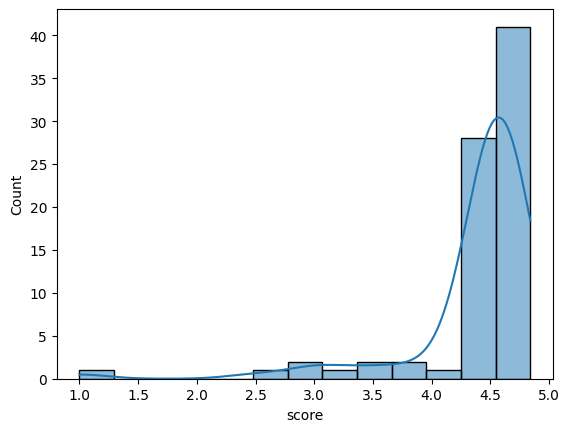

In [ ]:
sns.histplot(df_rating_avg, bins=13, kde=True) #most of the average app rating scores are between 4.5 and 5 in here.

<Axes: xlabel='score', ylabel='Count'>

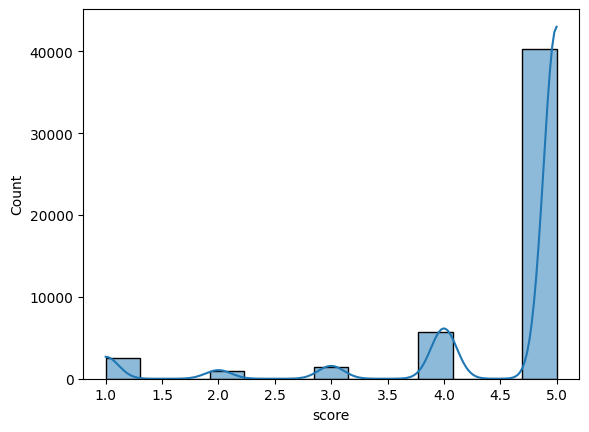

In [ ]:
sns.histplot(df_reviews.score, bins=13, kde=True) #most of the app scores are between 4.5 and 5 in here.

In [ ]:
#Data Pre-Processing & Cleaning
low_function=lambda x:x.lower()
df_reviews['content']=df_reviews['content'].astype(str).apply(low_function)
df_reviews['content']

0        i love this application very much i can monito...
1                                             very helpful
2                         never a problem. easy app to use
3                                   has really help me out
4        by far the most easiest to read thru and accur...
                               ...                        
55958    for a beta, it runs very smooth.  i think i pr...
55959                                              awesome
55961    this app shows different score then what the c...
55962                                                great
55963    only interface issue was that that accept butt...
Name: content, Length: 50952, dtype: object

In [ ]:
df_reviews['content'][3]

'has really help me out'

In [ ]:
!pip install advertools
import advertools as adv

In [ ]:
#checking the distribution of the emojis in the data
emoji_dict=adv.extract_emoji(df_reviews['content'])
emoji_list=emoji_dict['emoji']

In [ ]:
emoji_list= [i for i in emoji_list if i]
emoji_list[:10]

[['😕'],
 ['🤔', '😁'],
 ['🙌'],
 ['😊'],
 ['🤠'],
 ['🙂'],
 ['👍'],
 ['👍'],
 ['😒', '😒', '🤔'],
 ['👍🏾', '👍🏾']]

In [ ]:
from collections import Counter

emoji_list_sub = [emoji for sublist in emoji_list for emoji in sublist]
emoji_counts = Counter(emoji_list_sub)

In [ ]:
emoji_counts.most_common()[:10]
sorted_emojis=sorted(emoji_counts.items(), key=lambda x:x[1], reverse=True)
sorted_emojis[:13]

[('👍', 576),
 ('😊', 152),
 ('👌', 150),
 ('😁', 98),
 ('😍', 72),
 ('💯', 54),
 ('😎', 50),
 ('❤', 44),
 ('😀', 38),
 ('😇', 32),
 ('🤗', 32),
 ('😡', 32),
 ('🙂', 30)]

In [ ]:
emoji_chars=[] #To define axes of our plot
emoji_counts=[]

for i in sorted_emojis[:13]:
    emoji_chars.append(i[0]), emoji_counts.append(i[1])

In [ ]:
df_emojis=pd.DataFrame({'emoji_characters': emoji_chars, 'count_of_emojis': emoji_counts}) #we prepared our emoji dataframe in here.
df_emojis.head()

,emoji_characters,count_of_emojis
0,👍,576
1,😊,152
2,👌,150
3,😁,98
4,😍,72


In [ ]:
df_emojis.tail()

,emoji_characters,count_of_emojis
8,😀,38
9,😇,32
10,🤗,32
11,😡,32
12,🙂,30


In [ ]:
import plotly.graph_objs as go
from plotly.offline import iplot

In [ ]:
emoji_plot=go.Bar(x=df_emojis['emoji_characters'], y=df_emojis['count_of_emojis'])
iplot([emoji_plot])

In [ ]:
#removing emojis

!pip install demoji
import demoji

In [ ]:
df_reviews['content']=df_reviews['content'].apply(lambda x:demoji.replace(x,''))

In [ ]:
#removing Stopwords

Removing stopwords improve the performance. Words such as I,you, yours, me, myself, they, their etc are some kinds of stopwords and need to be excluded from the data for the further good analysis.

In [ ]:
!pip install stopwords

In [ ]:
!pip install wordcloud

In [ ]:
from wordcloud import WordCloud, STOPWORDS

In [ ]:
df_reviews.head()

,reviewCreatedVersion,score,content
0,1.63.0,5,i love this application very much i can monito...
1,1.63.0,5,very helpful
2,1.63.0,5,never a problem. easy app to use
3,1.62.1,5,has really help me out
4,1.63.0,5,by far the most easiest to read thru and accur...


In [ ]:
stopwords=set(STOPWORDS)
list_stopwords=list(stopwords)
list_stopwords[:10] #The words we will ignore in our data.

["didn't", "they're", 'who', 'as', 'to', 'her', 'have', 'it', 'above', 'until']

In [ ]:
total_reviews=' '.join(df_reviews['content'])

In [ ]:
wordcloud=WordCloud(width=991, height=497, stopwords=stopwords).generate(total_reviews) #stopwords=stopwords with this argument we eliminated our stopwords words in here.

(-0.5, 990.5, 496.5, -0.5)

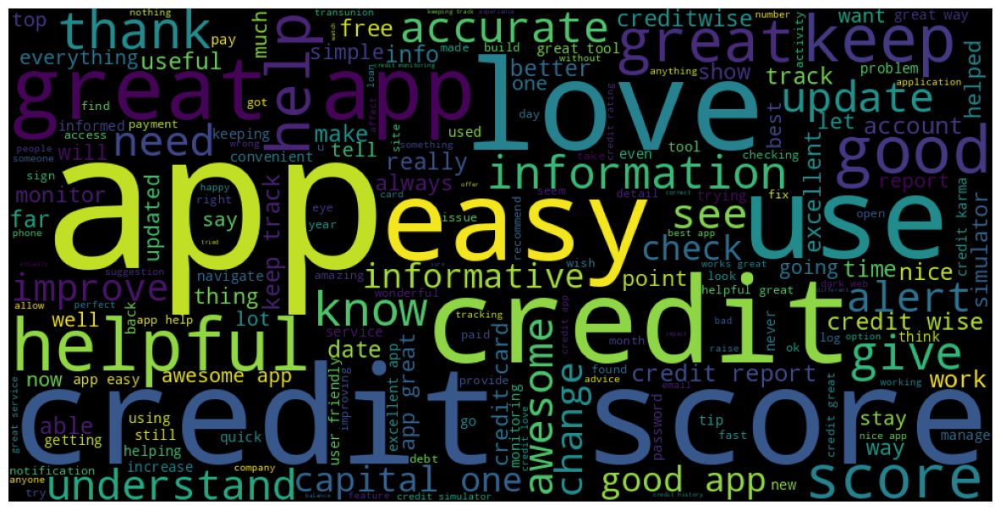

In [ ]:
#In here we see the most used words in our dataframe's contents.
plt.figure(figsize=(15,13))
plt.imshow(wordcloud) #we used imshow() in here to show the wordcloud
plt.axis('off') #we removed the axis

In [ ]:
#checking the most frequent words in the wordcloud
print(wordcloud.words_.keys()), print(wordcloud.words_.values())

dict_keys(['app', 'credit score', 'love', 'credit', 'use', 'easy', 'great app', 'helpful', 'good', 'keep', 'great', 'help', 'score', 'thank', 'know', 'give', 'information', 'accurate', 'see', 'need', 'awesome', 'update', 'alert', 'understand', 'improve', 'change', 'good app', 'capital one', 'informative', 'check', 'credit report', 'work', 'account', 'credit wise', 'really', 'time', 'date', 'make', 'better', 'excellent', 'nice', 'far', 'free', 'able', 'info', 'keep track', 'useful', 'creditwise', 'track', 'credit card', 'always', 'app great', 'simulator', 'helped', 'way', 'let', 'thing', 'point', 'monitor', 'show', 'will', 'simple', 'updated', 'now', 'top', 'say', 'everything', 'much', 'best', 'well', 'going', 'one', 'stay', 'report', 'tell', 'want', 'awesome app', 'lot', 'great tool', 'trying', 'keeping', 'used', 'informed', 'great way', 'user friendly', 'app easy', 'convenient', 'quick', 'tool', 'pay', 'using', 'excellent app', 'monitoring', 'increase', 'manage', 'problem', 'new', 'na

(None, None)

In [ ]:
list(wordcloud.words_.items())[:7]

[('app', 1.0),
 ('credit score', 0.9540155440414507),
 ('love', 0.8095854922279793),
 ('credit', 0.7380181347150259),
 ('use', 0.6946243523316062),
 ('easy', 0.6748704663212435),
 ('great app', 0.5777202072538861)]

In [ ]:
print(list(wordcloud.words_.items())[:7]) #we see that app, credit score and love is the top 3 words in our wordcloud.

[('app', 1.0), ('credit score', 0.9540155440414507), ('love', 0.8095854922279793), ('credit', 0.7380181347150259), ('use', 0.6946243523316062), ('easy', 0.6748704663212435), ('great app', 0.5777202072538861)]


In [ ]:
#Creating our sentiment analysis data
#removing stopwords from our dataframe
#stop_words=stopwords.words('english')
df_reviews['content']= df_reviews['content'].apply(lambda x : x if x not in stopwords else None)

In [ ]:
#Stemming
#Stemming is also an important process, it chops off the end of the word and transform the word into its root form. All suffixes like -s, -es, -ed, -ing are removed.

In [ ]:
def reviews_stemming(review):
  ps=PorterStemmer()
  if review is not None:
    for word in review.split():
      ps.stem(word)

In [ ]:
df_reviews['content'].apply(lambda review: reviews_stemming(review))

0        None
1        None
2        None
3        None
4        None
         ... 
55958    None
55959    None
55961    None
55962    None
55963    None
Name: content, Length: 50952, dtype: object

In [ ]:
df_reviews['content']

0        i love this application very much i can monito...
1                                             very helpful
2                         never a problem. easy app to use
3                                   has really help me out
4        by far the most easiest to read thru and accur...
                               ...                        
55958    for a beta, it runs very smooth.  i think i pr...
55959                                              awesome
55961    this app shows different score then what the c...
55962                                                great
55963    only interface issue was that that accept butt...
Name: content, Length: 50952, dtype: object

In [ ]:
#Scoring the reviews
#In here we will try to score the reviews according to their content and will see the sentiment scores of them.
df_reviews.head()

,reviewCreatedVersion,score,content
0,1.63.0,5,i love this application very much i can monito...
1,1.63.0,5,very helpful
2,1.63.0,5,never a problem. easy app to use
3,1.62.1,5,has really help me out
4,1.63.0,5,by far the most easiest to read thru and accur...


In [ ]:
#creating the scores
def sentiment_score(i):
  if i is not None:
    return TextBlob(i).sentiment

In [ ]:
df_reviews['sentiment_score']=df_reviews['content'].apply(lambda x: sentiment_score(x))

In [ ]:
df_reviews.head()

,reviewCreatedVersion,score,content,sentiment_score
0,1.63.0,5,i love this application very much i can monito...,"(0.38, 0.43)"
1,1.63.0,5,very helpful,"(0.2, 0.3)"
2,1.63.0,5,never a problem. easy app to use,"(0.43333333333333335, 0.8333333333333334)"
3,1.62.1,5,has really help me out,"(0.2, 0.2)"
4,1.63.0,5,by far the most easiest to read thru and accur...,"(0.3666666666666667, 0.7111111111111111)"


<a id='conclusions'></a>
## Conclusions

In our project we basically try to see the dispersion of the reviews, emojis and sentiment analysis of our Google Play Store Reviews.

At the beginning we see that most of the scores are 5s with 78% then 4s 11% and this is very interesting that a serious gap exists between the scores of 5s and 4s in here.

Regarding the versions we see version 1.39.0 has 4.84 score which is the highest scores of the versions of the applications.

Based on our analysis we can see that the top 3 emojis mostly seen in the reviews are "👍", "😊" and "👌". The least 3 emojis are "🙂", "😡" and "🤗".

When we check our wordcloud we see that "app", "credit score", "love", "credit" and "use" are the top 5 words in our wordcloud too.

In the analysis above we see the sentiment polarity and subjectivity also. Polarity means that whether or not the review is positive or negative, and subjectivity signifies the subjectivity of the text. Based on that we can see the scores of our dataset in our dataset's "sentiment_score" column.


Apart from this analysis, we can use this analysis as a template for the further analysis especially for the customer behaviours who try to use different applications etc. We can see the distribution of the customer types, reviews and sentiment scores as well.